<h1 style="font-family:Corbel Light; color:#97a9fd">Projet 6 : Classifiez automatiquement des biens de consommation </h1>

<h2 style="font-family:Corbel Light; color:#737373"><span style="color:#97a9fd">Étape 2</span> : Étude de la faisabilité d'un moteur de classification - Images</h2>

<h3 style="font-family:Corbel Light; color:#737373">Requirements</h3>

In [ ]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt

from random import randint
from enum import Enum
from math import ceil

import PIL
from PIL import Image, ImageOps, ImageFilter

import cv2
import time

import sklearn
from sklearn import manifold
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.metrics import adjusted_rand_score, confusion_matrix

import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import toolbox

%matplotlib inline
pd.options.display.float_format = '{:_.2f}'.format

In [2]:
python_version = !python -V
print('python version :', python_version, '\n')
print('pandas version : ', pd.__version__, '\n')
print('numpy version : ', np.__version__, '\n')
print('matplotlib version : ', matplotlib.__version__, '\n')
print('seaborn version : ', sns.__version__, '\n')
print('scikit-learn version : ', sklearn.__version__, '\n')
print('pillow version : ', PIL.__version__, '\n')
print('OpenCV version : ', cv2.__version__, '\n')
print('tensorflow version : ', tf.__version__, '\n')

python version : ['Python 3.9.12'] 

pandas version :  1.4.2 

numpy version :  1.23.5 

matplotlib version :  3.7.1 

seaborn version :  0.12.2 

scikit-learn version :  1.2.1 

pillow version :  9.5.0 

OpenCV version :  4.7.0 

tensorflow version :  2.12.0 



**Versions utilisées :**

- python : Python 3.9.12 
- seaborn    :  0.12.2
- matplotlib :  3.7.1 
- numpy  :  1.23.5 
- pandas :  1.4.2
- scikit-learn :  1.2.1
- pillow :  9.5.0
- opencv :  4.7.0
- tensorflow :  2.12.0

<h3 style="font-family:Corbel Light; color:#737373">Inspection des données</h3>

**Prétraiter des images - CE5 : Vous vous êtes assurés que les images utilisées ne relèvent pas d’une propriété intellectuelle.**

Dans l'énoncé du projet, Linda, Lead Data Scientist, nous indique qu'elle a "bien vérifié qu’il n’y avait aucune contrainte de propriété intellectuelle sur les données et les images" du jeu de données ci-dessous.

In [4]:
products = pd.read_pickle('products_data_cleaned.pkl')

In [5]:
products.head()

,description,product_name,image,_target,_description_cleaned,_name_cleaned,_name_and_description,_name_and_description_cleaned
0,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,key eleg polyest multicolor abstract eyelet do...,eleg polyest multicolor abstract eyelet door c...,Elegance Polyester Multicolor Abstract Eyelet ...,eleg polyest multicolor abstract eyelet door c...
1,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,sathiya cotton bath towel bath towel red yello...,sathiya cotton bath towel,Sathiyas Cotton Bath Towel Specifications of S...,sathiya cotton bath towelsathiya cotton bath t...
2,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,key eurospa cotton terri face towel set size s...,eurospa cotton terri face towel set,Eurospa Cotton Terry Face Towel Set Key Featur...,eurospa cotton terri face towel setkey eurospa...
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,key santosh royal fashion cotton king size dou...,santosh royal fashion cotton print king size d...,SANTOSH ROYAL FASHION Cotton Printed King size...,santosh royal fashion cotton print king size d...
4,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,key jaipur cotton floral king size doubl bedsh...,jaipur print cotton floral king size doubl bed...,Jaipur Print Cotton Floral King sized Double B...,jaipur print cotton floral king size doubl bed...


Gardons uniquement la colonne image et la colonne catégorie (la partie nettoyage du jeu de données a déjà été faite dans le notebook sur le traitement de texte).

In [6]:
products_subset = products[['_target', 'image']].copy()
products_subset.head()

,_target,image
0,Home Furnishing,55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,Baby Care,7b72c92c2f6c40268628ec5f14c6d590.jpg
2,Baby Care,64d5d4a258243731dc7bbb1eef49ad74.jpg
3,Home Furnishing,d4684dcdc759dd9cdf41504698d737d8.jpg
4,Home Furnishing,6325b6870c54cd47be6ebfbffa620ec7.jpg


Affichons des images selon leur catégorie :

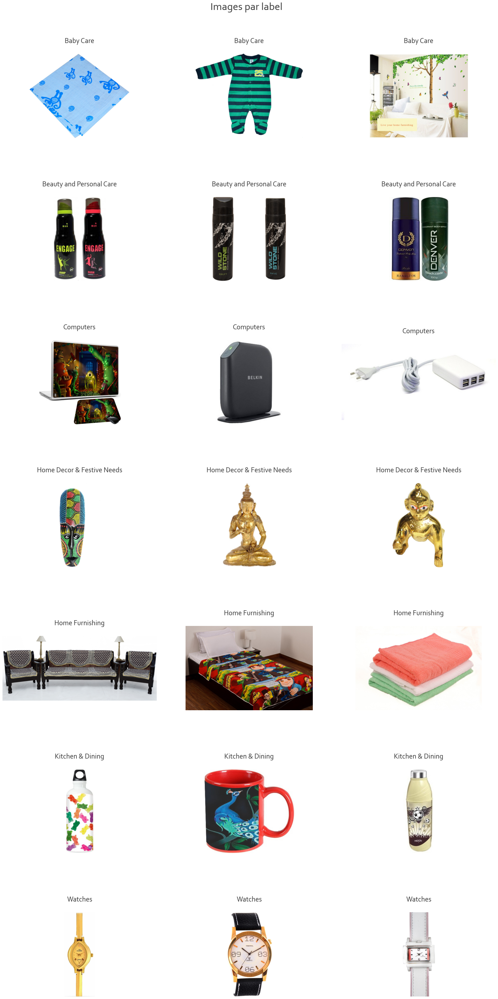

In [7]:
toolbox.display_image_by_label(products_subset,
                               '_target', 'image',
                               3, (20, 40),
                               top=0.93,
                               wspace=0.1,
                               hspace=0.7,
                               img_path='./Flipkart/Images/')

Regardons la taille des images en pixel

In [ ]:
img_path = './Flipkart/Images/'
products_subset['w'] = products_subset.apply(lambda row: Image.open(img_path+row['image']).size[0], axis=1)
products_subset['h'] = products_subset.apply(lambda row: Image.open(img_path+row['image']).size[1], axis=1)

In [9]:
products_subset.sort_values('w', ascending=False).head()

,_target,image,w,h
677,Kitchen & Dining,5518124b75d6c6dfee4c2e4c0cfa716a.jpg,8484,11042
218,Kitchen & Dining,ce02ab514e4c623dcf7acd7182a7762d.jpg,6000,2942
969,Home Furnishing,b3e5f93856cce162850713bb8edce52a.jpg,5855,3275
238,Kitchen & Dining,2e8df36b35d22cf219cf8bae6c2af752.jpg,5760,3840
287,Home Furnishing,a66a68fbed935f90b62d5d29003267fc.jpg,5701,2395


In [10]:
products_subset.describe()

,w,h
count,1_050.00,1_050.00
mean,1_196.57,1_220.04
std,864.08,744.84
min,145.00,160.00
25%,747.25,844.00
50%,1_100.00,1_100.00
75%,1_214.25,1_360.00
max,8_484.00,11_042.00


La taille de certaines images peut poser des problèmes par la suite. En particulier, la méthode 'detectAndCompute' de l'algorithme SIFT (utilisée pour trouver des points d'intérêts et calculer leurs descripteurs) semble faire crasher mon ordinateur lorsque l'image en entrée est "trop grande".

Regardons de plus près l'image la plus grande, à propos de laquelle une alerte est levée.

In [11]:
idx = products_subset.loc[products_subset['h'] == products_subset['h'].max()].index[0]

Dimensions de l'image la plus grande du jeu de données : (11042, 8484, 3)


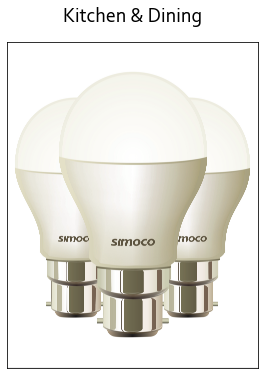

In [12]:
img_name = products_subset['image'][idx]
image = cv2.imread(img_path + img_name, 3)
print('Dimensions de l\'image la plus grande du jeu de données :', image.shape)

toolbox.display_image(image,
                      products_subset['_target'][idx],
                      (12, 6))

Essayons de la réduire :

In [13]:
image_resized = cv2.resize(image, (0,0), fx=.1, fy=.1, interpolation=cv2.INTER_CUBIC)
image_resized.shape

(1104, 848, 3)

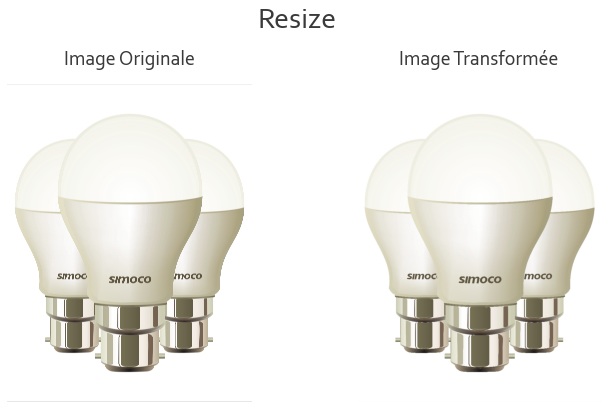

In [14]:
toolbox.display_image_transformation(Image.fromarray(image.astype('uint8')), 
                                     Image.fromarray(image_resized.astype('uint8')), 
                                     'Resize', (10, 6), top=0.8)

<h3 style="font-family:Corbel Light; color:#737373">Exemples de traitement d'images</h3>

**Prétraiter des images - CE1 : Vous avez utilisé des librairies spécialisées pour un premier traitement du contraste (ex. : openCV).**

**Prétraiter des images - CE2 : Vous avez présenté des opérations de retraitement d'images (par exemple passage en gris, filtrage du bruit, égalisation, floutage) sur un ou plusieurs exemples.**

In [15]:
img_file = img_path + '7cbbe686c4a233e8cf53528748f75223.jpg'

<h4 style="font-family:Corbel Light; color:#737373">Passage au gris</h4>

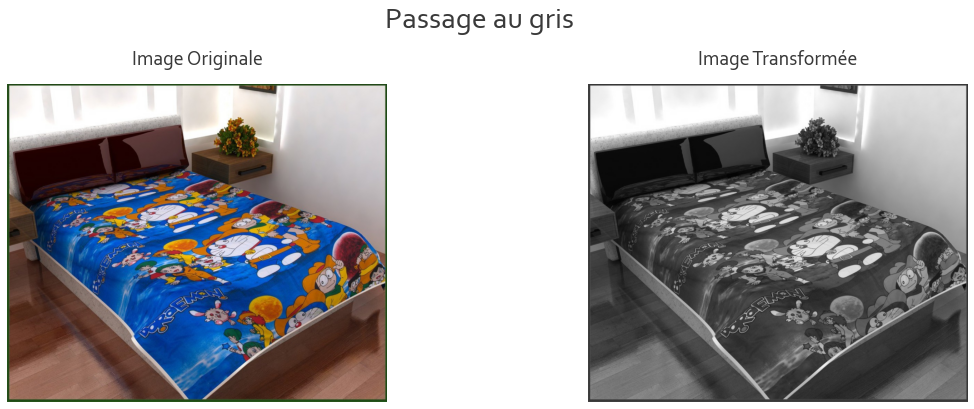

In [16]:
img = Image.open(img_file)
img_grey = cv2.imread(img_file, 0)
img_grey = Image.fromarray((img_grey).astype('uint'))

toolbox.display_image_transformation(img, 
                                     img_grey, 
                                     'Passage au gris', 
                                     (15, 6), 
                                     hspace=0.3, wspace=0.3, top=0.8)

<h4 style="font-family:Corbel Light; color:#737373">Floutage</h4>

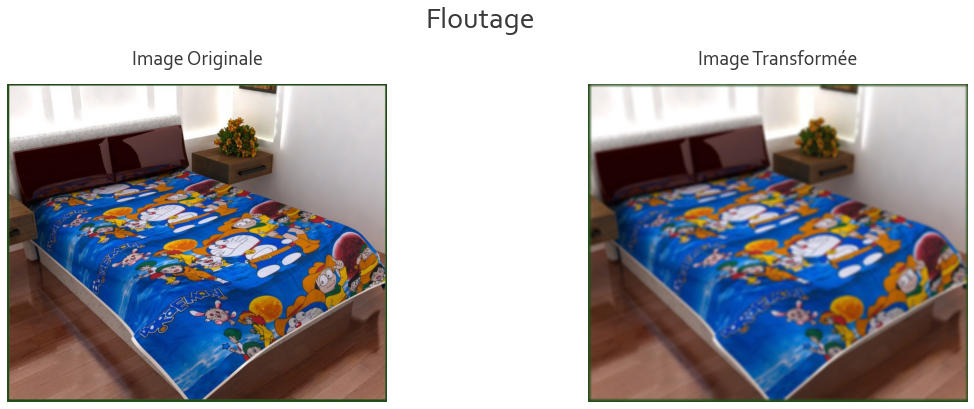

In [17]:
img_cv2 = cv2.imread(img_file)
img_blurred = cv2.blur(img_cv2, (10, 10))

toolbox.display_image_transformation(cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB), 
                                     cv2.cvtColor(img_blurred, cv2.COLOR_BGR2RGB), 
                                     'Floutage', 
                                     (15, 6), 
                                     hspace=0.3, wspace=0.3, top=0.8)

<h4 style="font-family:Corbel Light; color:#737373">Étirement de l'histogramme : amélioration de la luminosité</h4>

Regardons les histogrammes d'images en noir et blanc. 

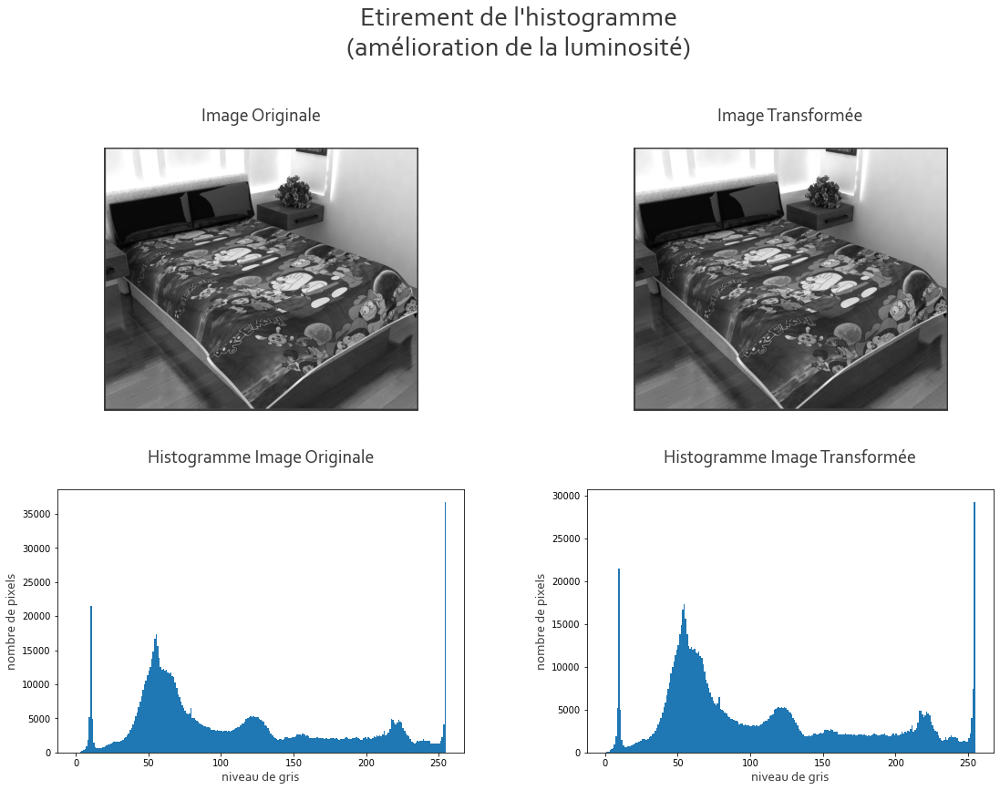

In [18]:
img_grey = ImageOps.grayscale(img)
img_tf = ImageOps.autocontrast(img_grey)
toolbox.display_histo_transformation(img_grey, img_tf,
                                     'Etirement de l\'histogramme\n(amélioration de la luminosité)',
                                     (15, 12), hspace=0.3, wspace=0.3, top=0.8)

<h4 style="font-family:Corbel Light; color:#737373">Égalisation de l'histogramme : amélioration du contraste</h4>

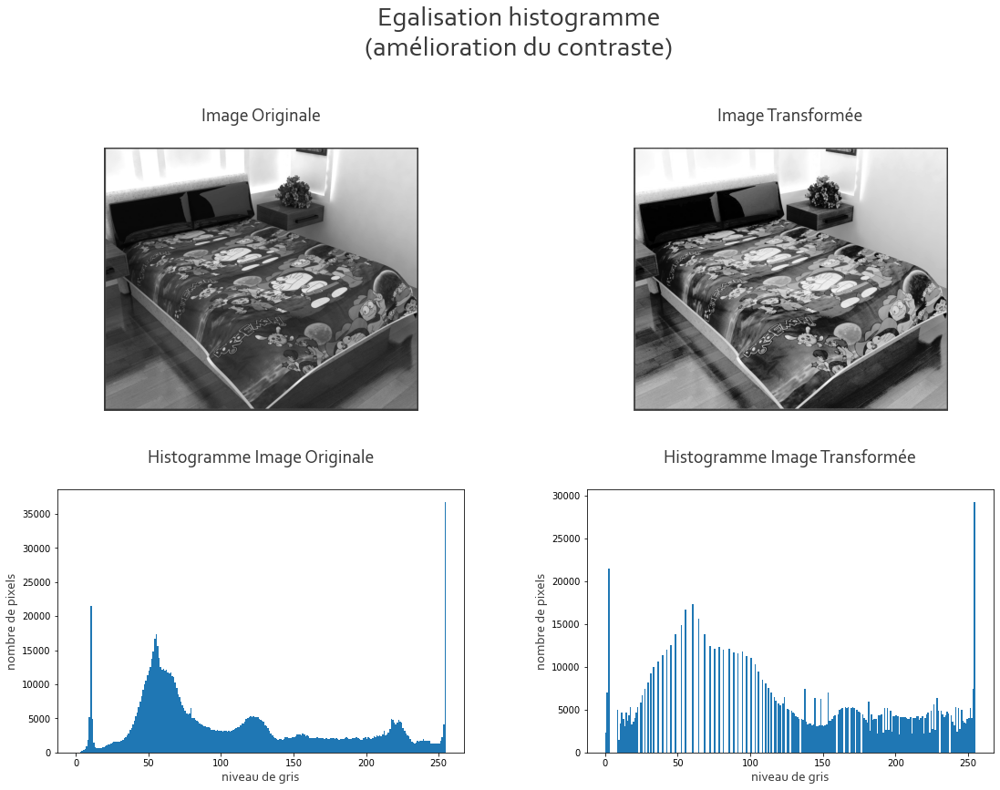

In [19]:
img_tf = ImageOps.equalize(img_grey)

toolbox.display_histo_transformation(img_grey, img_tf, 
                                     'Egalisation histogramme\n(amélioration du contraste)', 
                                     (15, 12), hspace=0.3, wspace=0.3, top=0.8)

<h4 style="font-family:Corbel Light; color:#737373">Filtrage du bruit : Lissage par moyennage</h4>

Difficile de voir la différence à l'oeil nu

In [20]:
img_filtered = img.filter(ImageFilter.GaussianBlur(1))

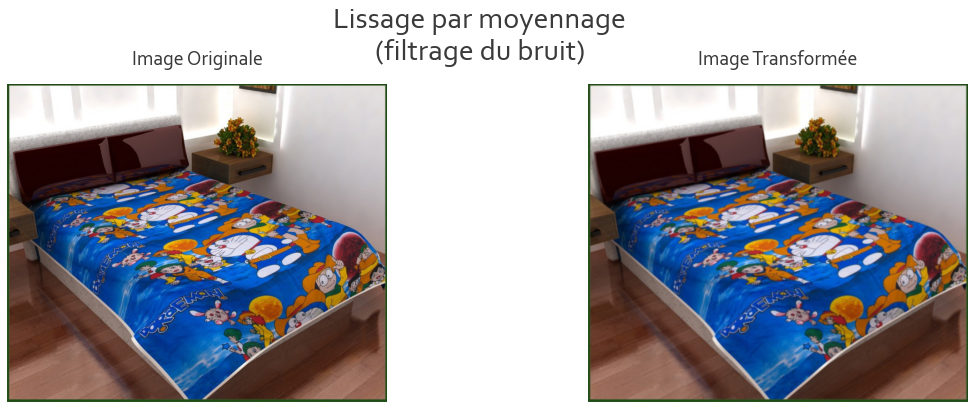

In [21]:
toolbox.display_image_transformation(img, img_filtered,
                                     'Lissage par moyennage\n(filtrage du bruit)',
                                     (15, 6), hspace=0.3, wspace=0.3, top=0.8)

<h4 style="font-family:Corbel Light; color:#737373">Transformation géométrique : Rotation</h4>

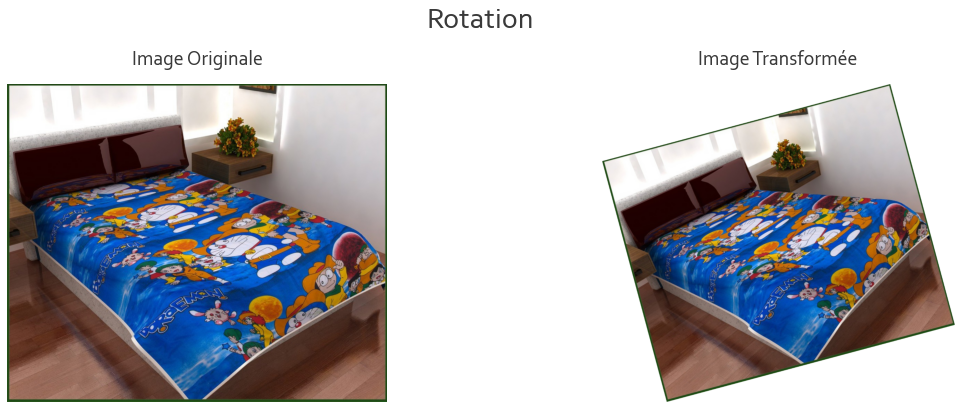

In [22]:
img_rotated = img.rotate(15,
                         expand=True,
                         fillcolor='white',
                         resample=Image.Resampling.BILINEAR)

toolbox.display_image_transformation(img, img_rotated,
                                     'Rotation', (15, 6),
                                     hspace=0.3, wspace=0.3, top=0.8)

<h3 style="font-family:Corbel Light; color:#737373">SIFT</h3>

**Prétraiter des images - CE3 Vous avez élaboré une fonction permettant d'extraire des features ("feature engineering") de type "bag-of-images" via la génération de descripteurs (algorithmes ORB, ou SIFT, ou SURF).** 

<h4 style="font-family:Corbel Light; color:#737373">Extraction des features SIFT</h4>

Regardons les features extraites par SIFT sur un exemple. Les features correspondent aux zones circulaires colorées, repérées par leur centre appelé point d'intérêt.

L'algorithme semble bien fonctionner. Il a bien détecté la plante (à droite sur la table basse), le contour du lit, les personnages sur la couverture ainsi que l'ombre projetée par le lit. 

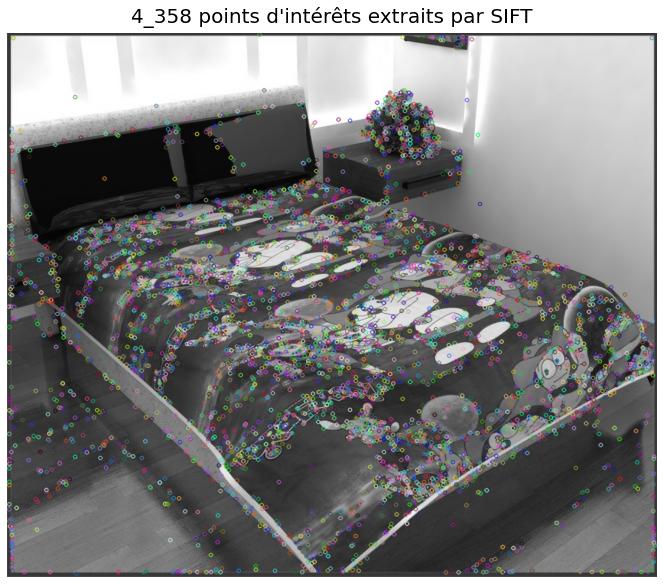


Descripteurs  associés aux features: 

[[  0.  15. 132. ...   0.   0.   0.]
 [130.  21.   0. ...   0.   0.   0.]
 [131.  53.   1. ...   0.   0.   0.]
 ...
 [ 49.   3.   2. ...   0.   1.   8.]
 [  0.   0.   0. ...   0.   2.  12.]
 [  0.   0.   1. ...   0.   1.   3.]]

Matrice de dimensions : (4358, 128)


In [23]:
toolbox.show_key_points_sift(img_file, (12, 10), True)

- L'image contient 4_358 features dont le voisinage est décrit par un "descripteur"
- Chaque descripteur est un vecteur de longueur 128

Appliquons l'algorithme à toutes les images de notre jeu de données et stockons leurs descripteurs dans une liste.

In [24]:
%%time
descriptors = toolbox.get_descriptors_sift(products_subset['image'],
                                           img_path,
                                           300, True)

image n° 1
image n° 101
image n° 201
image n° 301
image n° 401
image n° 501
image n° 601
image n° 701
image n° 801
image n° 901
image n° 1001
CPU times: total: 16min 2s
Wall time: 22min 24s


In [25]:
print("Nombre de descripteurs : {:_}".format(
    np.concatenate(descriptors, axis=0).shape[0]))

Nombre de descripteurs : 313_544


<h4 style="font-family:Corbel Light; color:#737373">Création des bag-of-features</h4>

La création des bag of features se fait en 2 étapes:

1. Création d'un "dictionnaire" de visual words en appliquant un algorithme de clustering aux descripteurs des features :
    - nombre de clusters k = racine carré du nombre total de descripteurs
    - visual words = centres des clusters trouvés
    
    
2. Création d'un histogramme pour chaque image indiquant la fréquence d'apparition de chacun des k visual words dans l'image
    - bag of features = vecteur contenant les k valeurs normalisées de l'histogramme

In [26]:
%%time
bag_of_features = toolbox.build_bag_of_features(descriptors)

Nombre de visual words :  560
CPU times: total: 30 s
Wall time: 53.2 s


In [27]:
bag_of_features.shape

(1050, 560)

<h4 style="font-family:Corbel Light; color:#737373">Réduction en 2D</h4>

Le résultat est très mauvais. Ces features ne semblent pas suffisamment bien représenter les images pour pouvoir les classifier de manière non supervisée à l'aide d'un algorithme KMeans. 

In [38]:
model_sift = {'data': bag_of_features, 'title': 'image', 'n_components': 0.98}

98.01% de variance expliquée par les 442 composantes ensembles


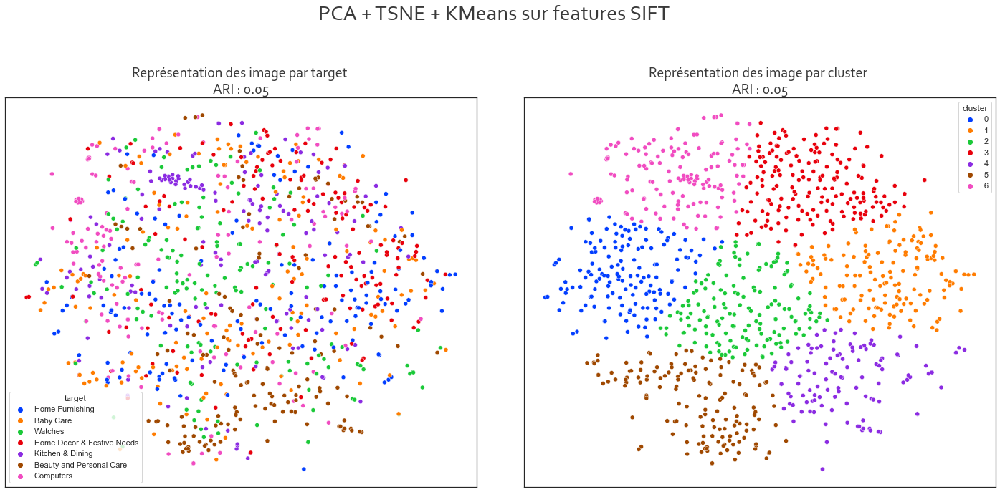

In [39]:
reduced_features_sift = toolbox.display_vizu_one(toolbox.LinearDimReduction.PCA, model_sift,
                                                 products_subset['_target'],
                                                 (20, 10),
                                                 ' sur features SIFT',
                                                 top=0.8, hspace=.7,
                                                 verbose=True
                                                 )

<h4 style="font-family:Corbel Light; color:#737373">Matrice de confusion</h4>

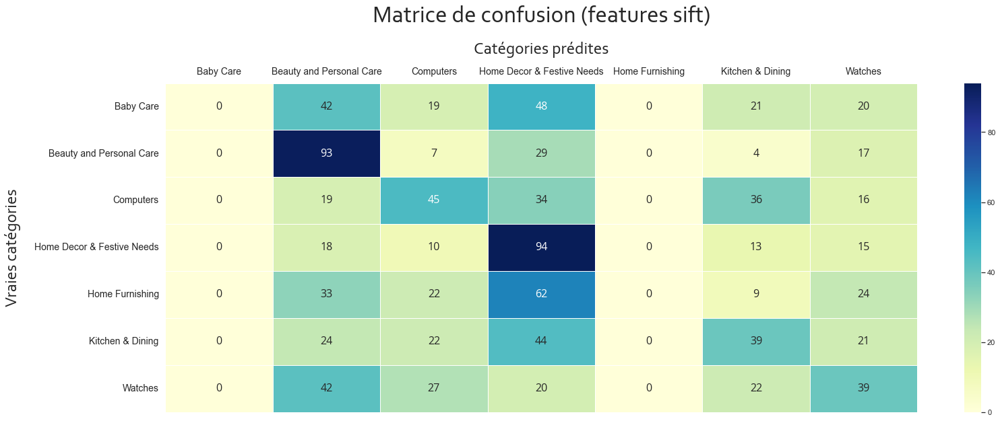

In [40]:
reduced_features_sift.rename(columns={"cluster": 'pred'}, inplace=True)

toolbox.plot_confusion_matrix(reduced_features_sift, (25, 9),
                              add_label=True,
                              title=' (features sift)')

<h3 style="font-family:Corbel Light; color:#737373">CNN Transfer Learning</h3>

**Prétraiter des images - CE4 : Vous avez élaboré et exécuté une fonction permettant d'extraire des features ("feature engineering") via un algorithme de Transfer Learning basé sur des réseaux de neurones, comme par exemple CNN.**

<h4 style="font-family:Corbel Light; color:#737373">Extraction des features - VGG16</h4>

Chargeons le modèle VGG-16 pré-entrainé:

In [41]:
vgg16 = VGG16()
new_model_vgg16 = Model(inputs=vgg16.inputs, outputs=vgg16.layers[-2].output)

new_model_vgg16.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

Utilisons les features du modèle pré-entrainé pour représenter nos images

In [ ]:
%%time
vgg16_features = toolbox.get_features_transfer_learning(new_model_vgg16,
                                                        products_subset['image'],
                                                        img_path, True)
vgg16_features.shape

<h4 style="font-family:Corbel Light; color:#737373">Extraction des features - ResNet50</h4>

In [45]:
resnet_50 = ResNet50()
new_model_resnet50 = Model(inputs=resnet_50.inputs,
                           outputs=resnet_50.layers[-2].output)
new_model_resnet50.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [46]:
%%time
resnet50_features = toolbox.get_features_transfer_learning(new_model_resnet50,
                                                           products_subset['image'],
                                                           img_path, True)
resnet50_features.shape

image n° 1
image n° 101
image n° 201
image n° 301
image n° 401
image n° 501
image n° 601
image n° 701
image n° 801
image n° 901
image n° 1001
CPU times: total: 13min 7s
Wall time: 6min 33s


(1050, 2048)

<h4 style="font-family:Corbel Light; color:#737373">Réduction en 2D</h4>

In [58]:
models_cnn = [{'data': vgg16_features,
               'title': 'image',
               'model': 'vgg-16',
               'n_components': 0.85},
              {'data': resnet50_features,
               'title': 'image',
               'model': 'resnet-50',
               'n_components': 0.9}]

85.01% de variance expliquée par les 309 composantes ensembles
90.02% de variance expliquée par les 354 composantes ensembles


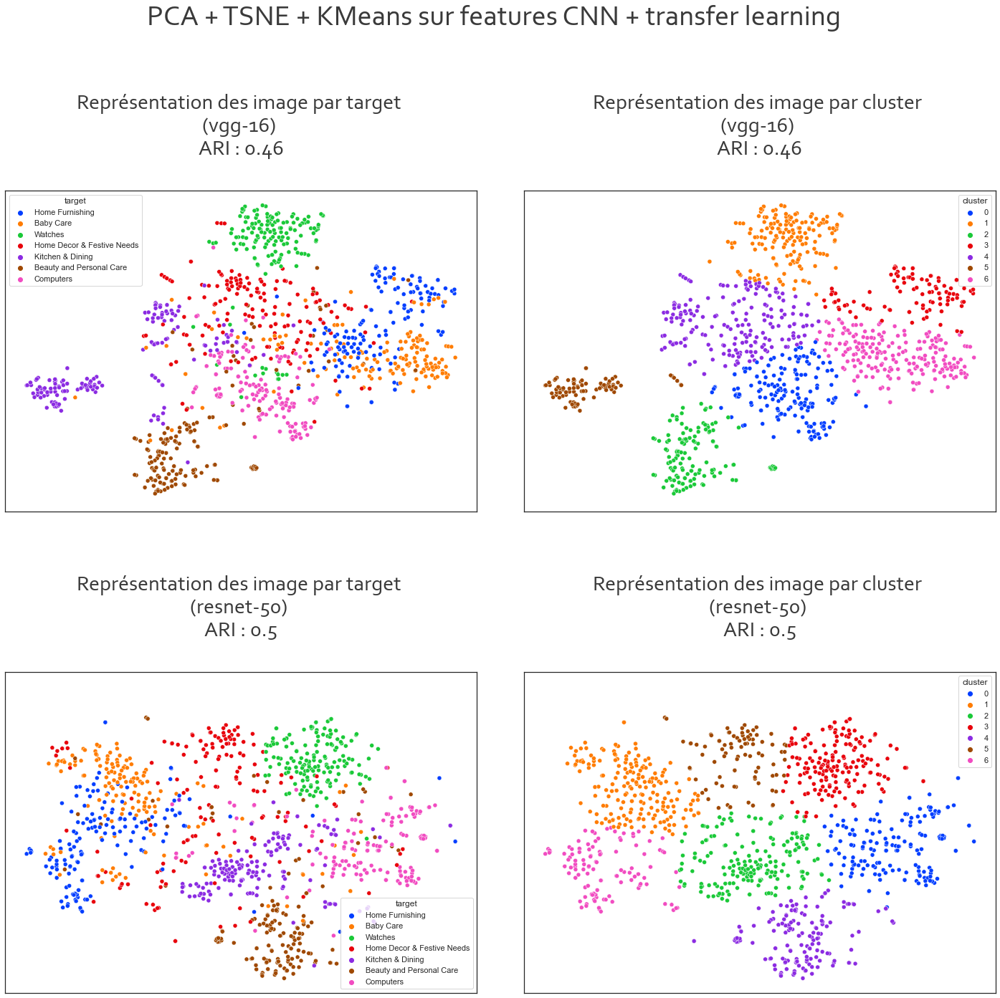

In [59]:
reduced_features_cnn = toolbox.display_vizu_many(toolbox.LinearDimReduction.PCA, models_cnn,
                                                 products_subset['_target'],
                                                 (20, 20),
                                                 ' sur features CNN + transfer learning',
                                                 top=0.8, hspace=.5,
                                                 verbose=True
                                                 )

<h4 style="font-family:Corbel Light; color:#737373">Matrice de confusion</h4>

Features VGG16 

Principales erreurs du modèle :
- articles "Kitchen & Dining" dans "Home Decor and Festive Needs"
- articles "Home Furnishing" classés en "Baby Care"

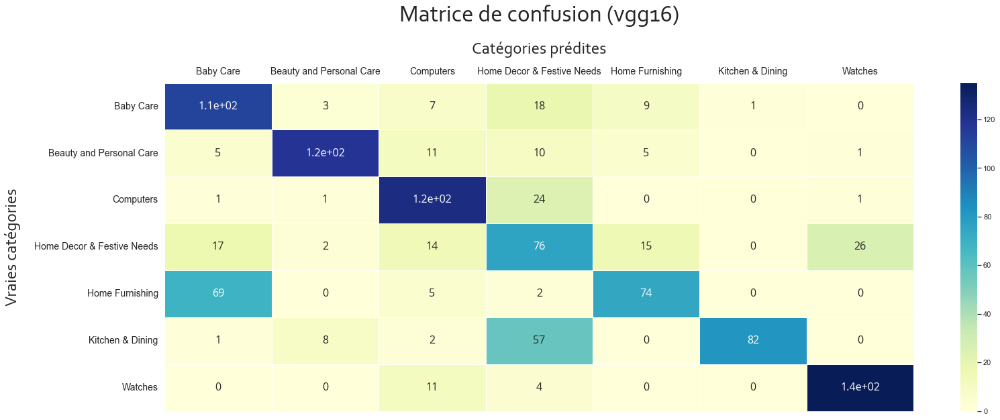

In [62]:
data_vgg16 = reduced_features_cnn['vgg-16']
data_vgg16.rename(columns={"cluster": 'pred'}, inplace=True)

toolbox.plot_confusion_matrix(data_vgg16, (25, 9),
                              add_label=True,
                              title=' (vgg16)')

Regardons quelques exemples d'articles "Home Furnishing" classés en "Baby Care" : il s'agit surtout de coussins, de nappes, de serviettes ... On peut effectivement trouver des articles similaires dans la catégorie bébé.

In [64]:
mismatch = data_vgg16.loc[(data_vgg16['target']=='Home Furnishing') & (data_vgg16['pred']==6)]
print(mismatch.shape)

(69, 6)


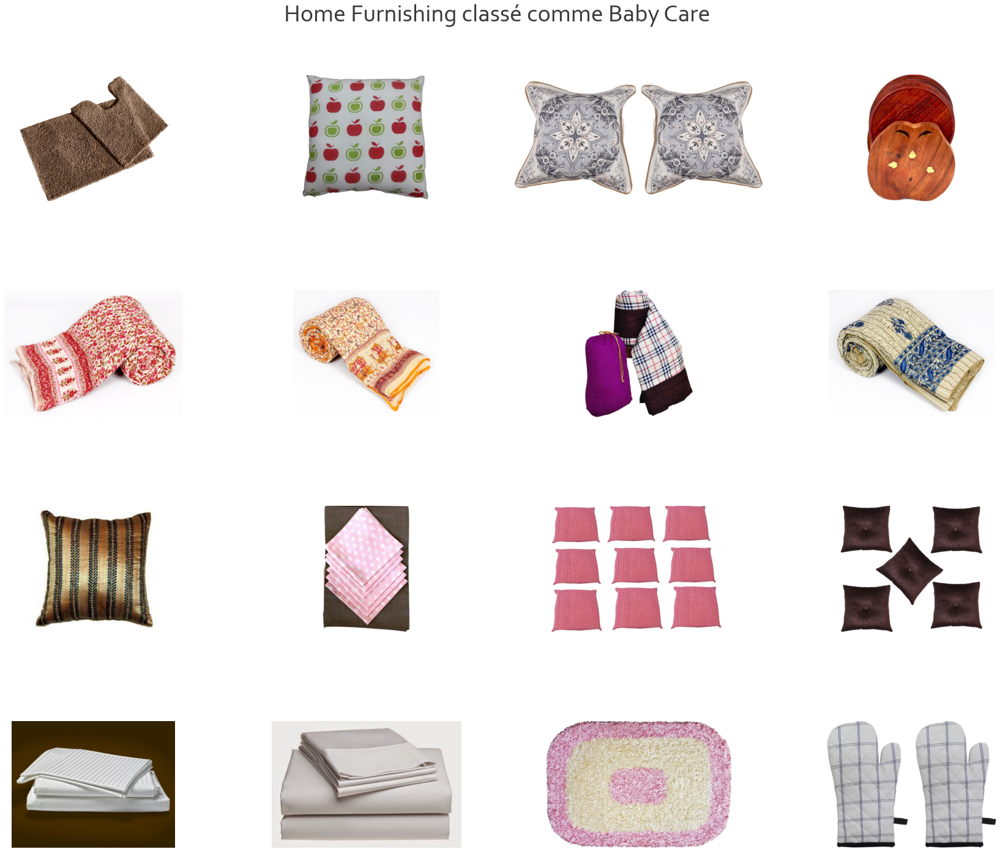

In [94]:
idx = mismatch.iloc[:16].index.values
toolbox.display_images_from_url(img_path, products_subset['image'][idx],
                                'Home Furnishing classé comme Baby Care',
                                4, (25, 20))

Regardons des exemples d'articles "Kitchen & Dining" classés dans la catégorie "Home Decor and Festive Needs" : beaucoup de couteaux à pizza (peut-être que le modèle les confond avec un autre article de forme arrondie similaire).

In [91]:
mismatch2 = data_vgg16.loc[(data_vgg16['target'] == 'Kitchen & Dining') & (data_vgg16['pred'] == 4)]
print(mismatch2.shape)

(57, 6)


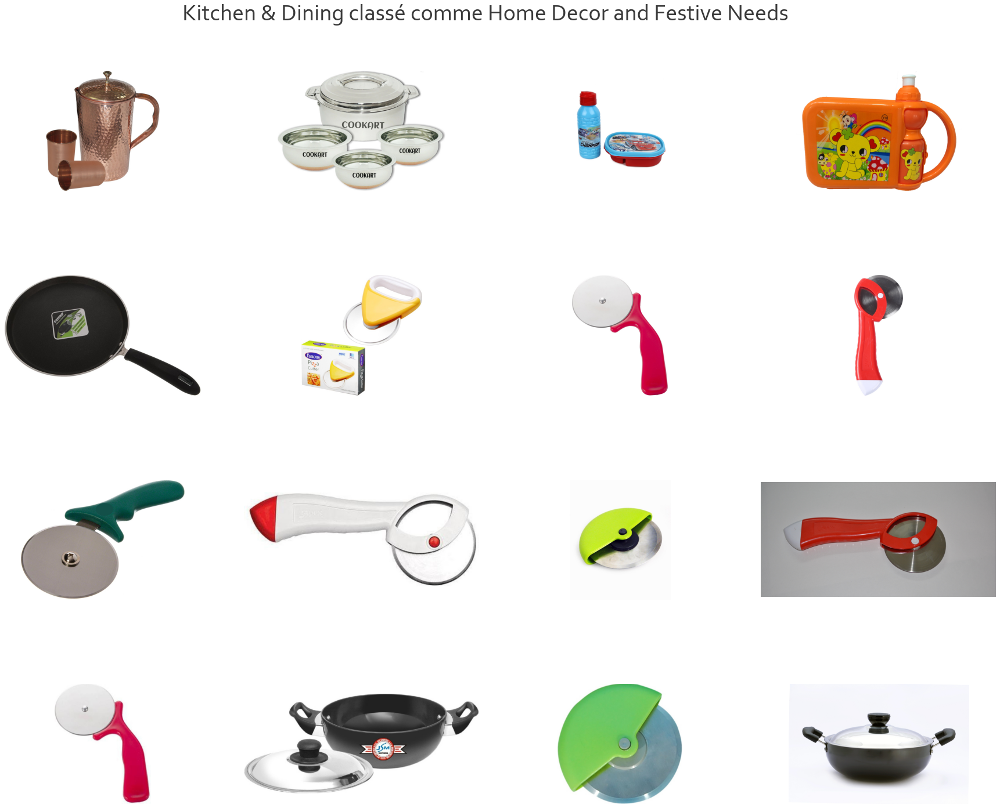

In [93]:
idx2 = mismatch2.iloc[:16].index.values
toolbox.display_images_from_url(img_path, products_subset['image'][idx2],
                                'Kitchen & Dining classé comme Home Decor and Festive Needs',
                                4, (25, 20))

Transfer Learning avec le modèle ResNet 50:

La principale erreur du modèle consiste également à classer des articles "Home Furnishing" en "Baby Care".

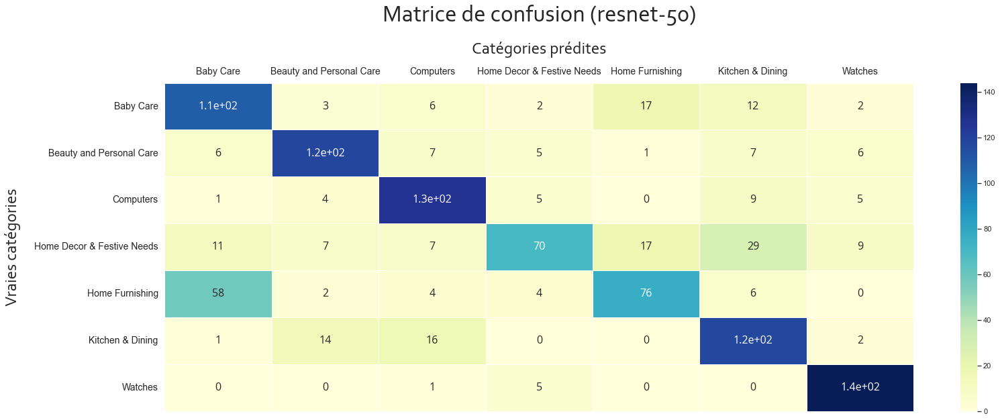

In [96]:
data_resnet50 = reduced_features_cnn['resnet-50']
data_resnet50.rename(columns={"cluster": 'pred'}, inplace=True)

toolbox.plot_confusion_matrix(data_resnet50, (25, 9),
                              add_label=True,
                              title=' (resnet-50)')

In [97]:
mismatch3 = data_resnet50.loc[(data_resnet50['target']=='Home Furnishing') & (data_resnet50['pred']==1)]
print(mismatch3.shape)

(58, 6)


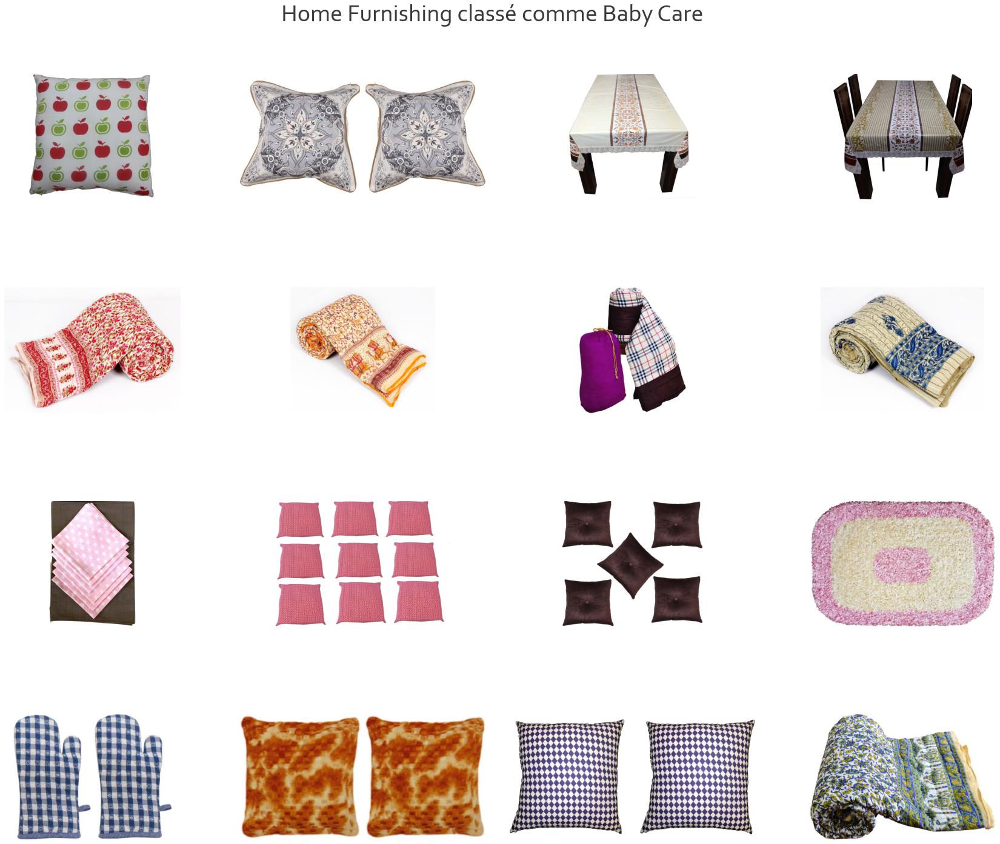

In [98]:
idx3 = mismatch3.iloc[:16].index.values
toolbox.display_images_from_url(img_path, products_subset['image'][idx3],
                                'Home Furnishing classé comme Baby Care',
                                4, (25, 20))

<h3 style="font-family:Corbel Light; color:#737373">Conclusion</h3>

Nous avons rapidement et facilement réussi à obtenir des partitions à moitié semblables à la partition originale en utilisant des features déjà apprises par des réseaux de neurones convolutifs pré-entrainés et disponibles sur internet.

Il semble donc faisable de classer les articles de ce jeu de données automatiquement à partir de leur image.